# Intro to Metadynamics

Metadynamics is a simulation method for enhanced sampling of a system as well as reconstructing the free energy. 

The free energy landscape will allow us to investigate the favourability of lidocaine occupying a given fenestration. Given the dimensions of Gaussian hills added are optimal and the system is starting in the energy minima, the 



# METADYNAMICS ROUND2

## COM selection for axes

topCOM | baseCOM | dist_fluc
--- | --- | --- 
resid 243 to 251 503 to 511 779 to 787 1071 to 1079 and name CA (8 on p1) | resid 136 to 140 459 to 463 709 to 713 1032 to 1036 291 to 295 551 to 555 837 to 841 1139 to 1143 and name CA (8 on s5/6) | 17.8911 - 18.5910
(1 on sf) | (1 on s5) | 17.3940 - 18.8244
 |  | 17.8238 - 18.5466
resid 244 to 250 504 to 510 780 to 786 1072 to 1078 and name CA | resid 139 to 141 462 to 464 712 to 714 1035 to 1037 294 to 296 554 to 556 840 to 842 1142 to 1144 and name CA | 17.5412 - 18.2633

## Unbiased Runs w/ PLUMED COLVARS

* s
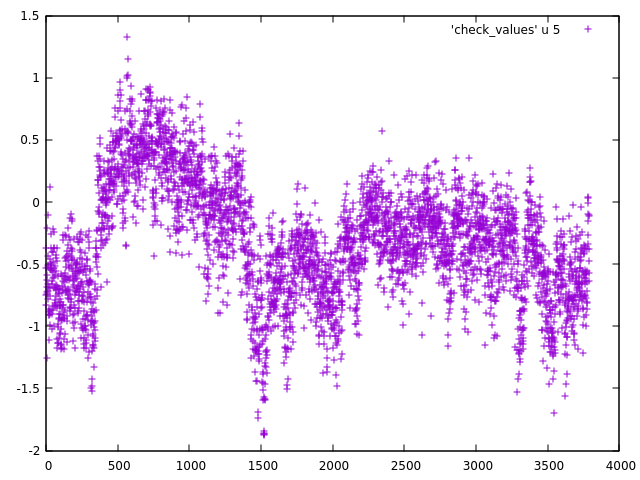

* z
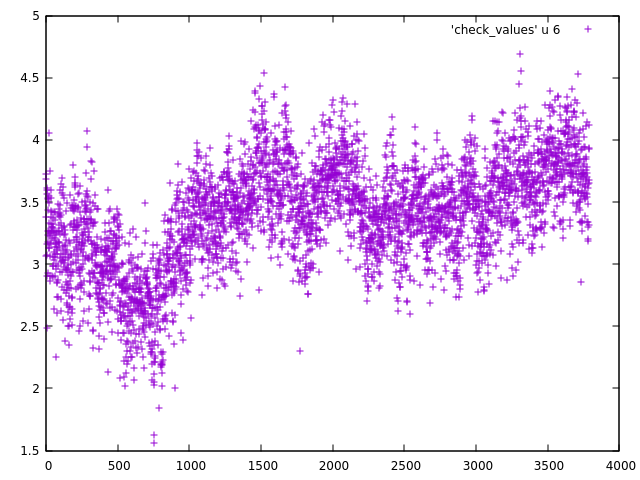

* theta
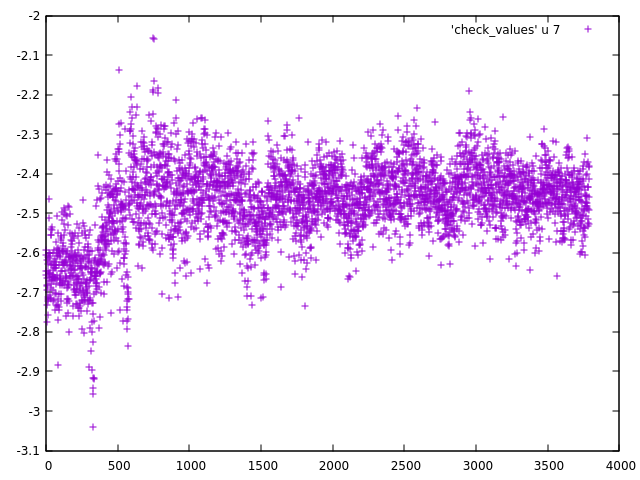

### Check colvar STDEV

stats 'check_values' every ::1500::-1 u 5 ;
stats 'check_values' every ::1500::-1 u 5 ;
stats 'check_values' every ::1500::-1 u 5 ; 

| STDEV | s | z | theta |
| --- | --- | --- | --- |
|  | 0.3553 | 0.3246 | 0.0685 |

## Check systems: @~25ns 
:: except WALKER4...@13ns

<h3><center>HILLS</center></h3>

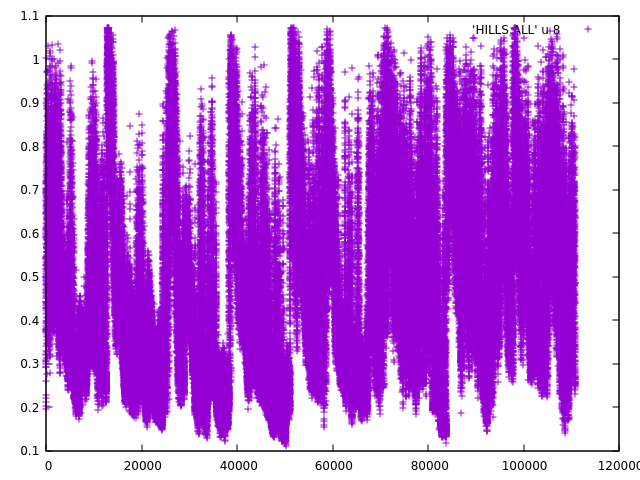

<h3><center>s</center></h3>

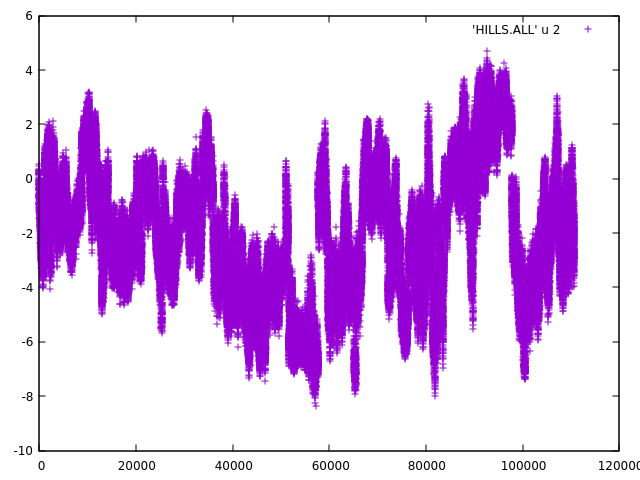

<h3><center>z</center></h3>

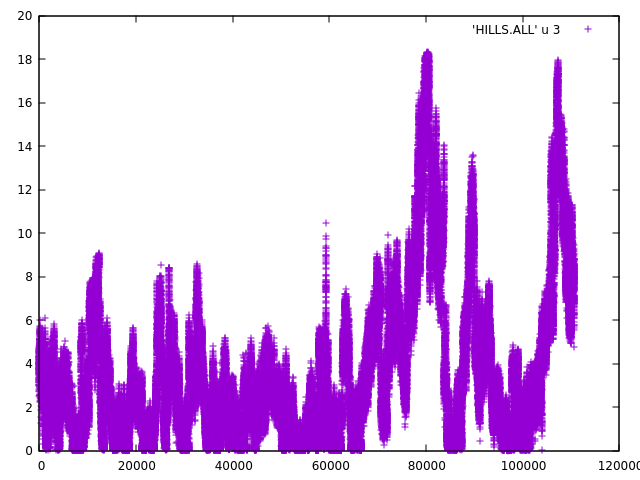

<h3><center>theta</center></h3>

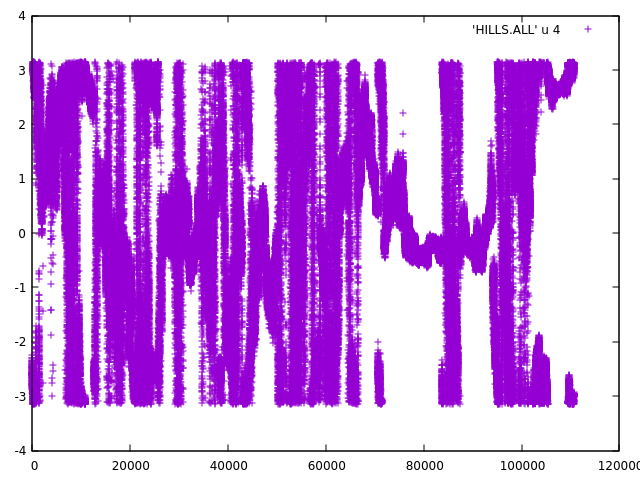

# 2D Free Energy (polar)

In [196]:
import pandas as pd 
import seaborn as sns 
import glob
import matplotlib.pyplot as plt 
import numpy as np
import dask.dataframe as dd

In [491]:
fes_polar30 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy30.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar30.dropna(how="all", inplace=True)
fes_polar40 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy40.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar40.dropna(how="all", inplace=True)
fes_polar55 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fes55.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar55.dropna(how="all", inplace=True)
fes_polar70 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy70.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar70.dropna(how="all", inplace=True)
fes_polar80 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy80.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar80.dropna(how="all", inplace=True)
fes_polar90 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy90.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar90.dropna(how="all", inplace=True)
fes_polar100 = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/fesxy100.grid', widths=[9,9,9], skiprows=9, header=None, names=['z','theta','fes'])
fes_polar100.dropna(how="all", inplace=True)

In [492]:
print(fes_polar100['fes'].max())
print(fes_polar100['fes'].min())

-13.127
-116.73299999999999


In [390]:
def plot_polar_fes(df):
    """Plot polar contour plot using free energy grid data in pandas df with cols:z,theta,fes"""
    
    z_unique = np.sort(df.z.unique())
    theta_unique = np.sort(df.theta.unique())
    values = df.pivot_table(index='z', columns='theta', values='fes').T.values
    
    # Fix missing grid data at theta=pi by duplicating the last row of fes values
    theta_unique = np.append(theta_unique, [3.142])
    values = np.append(values, [values[-1]], axis=0)
    
#     print(theta_unique)
#     print(z_unique)
#     print(values)
#     print(len(values))
#     print(len(values[0]))
#     print(len(theta_unique))
#     print(len(z_unique))
#     print(values[-1])
    
    z, theta = np.meshgrid(z_unique, theta_unique)
    fig, ax = plt.subplots(subplot_kw=dict(projection='polar'), figsize=(15,15))
    
    # Adjust plot orientation and labels
    #ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    ax.set_theta_offset(1.12) #5.2)
    #ax.set_ylim(0, 20)
    ax.tick_params(labelbottom=False, grid_color="palegreen")
    ax.set_rticks([5, 10, 15, 20])
    ax.set_thetagrids([334, 64, 154, 244])
    ax.set_rlabel_position(270)
    
    # Plot contour, specifying limits for contour boundaries and colour palette
    cont = ax.contourf(theta, z, values, levels=np.arange(-120, 20, 5), cmap='Spectral')
    
    cb = fig.colorbar(cont)
    cb.set_label("Free Energy")
    
    plt.text(3.5, 16.8, "DIV", fontsize=24)
    plt.text(1.97, 15, "DIII", fontsize=24)
    plt.text(4.9, 15.8, "DI", fontsize=24)
    plt.text(0.4, 15, "DII", fontsize=24)
    
    return fig, ax, cont

(<Figure size 1080x1080 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7f43280b0880>)

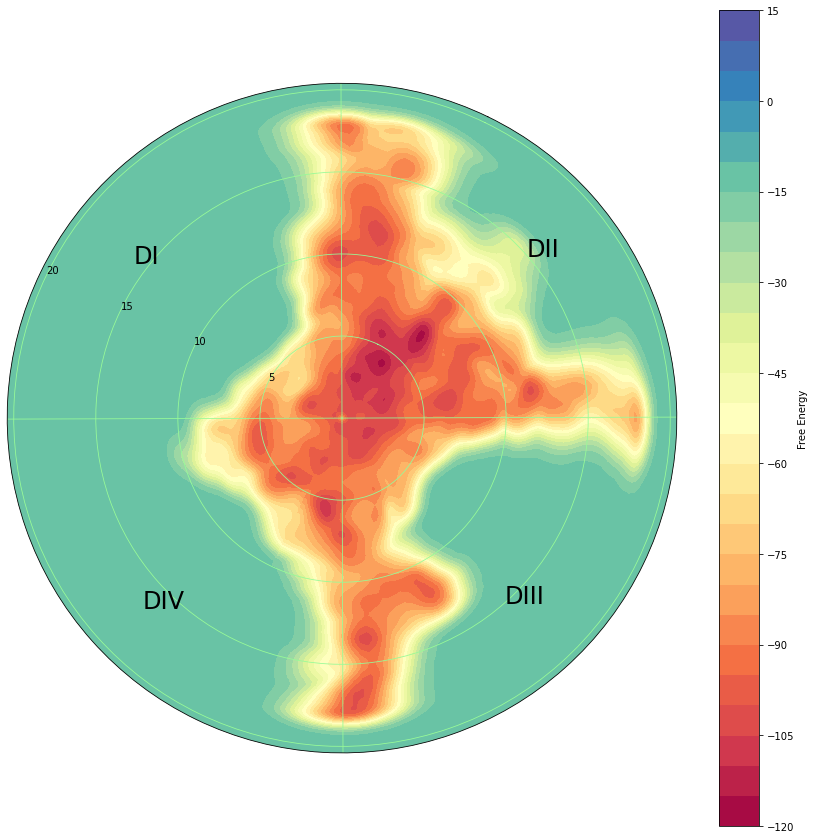

In [493]:
plot_polar_fes(fes_polar100)

(<Figure size 1080x1080 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7f433b5888e0>)

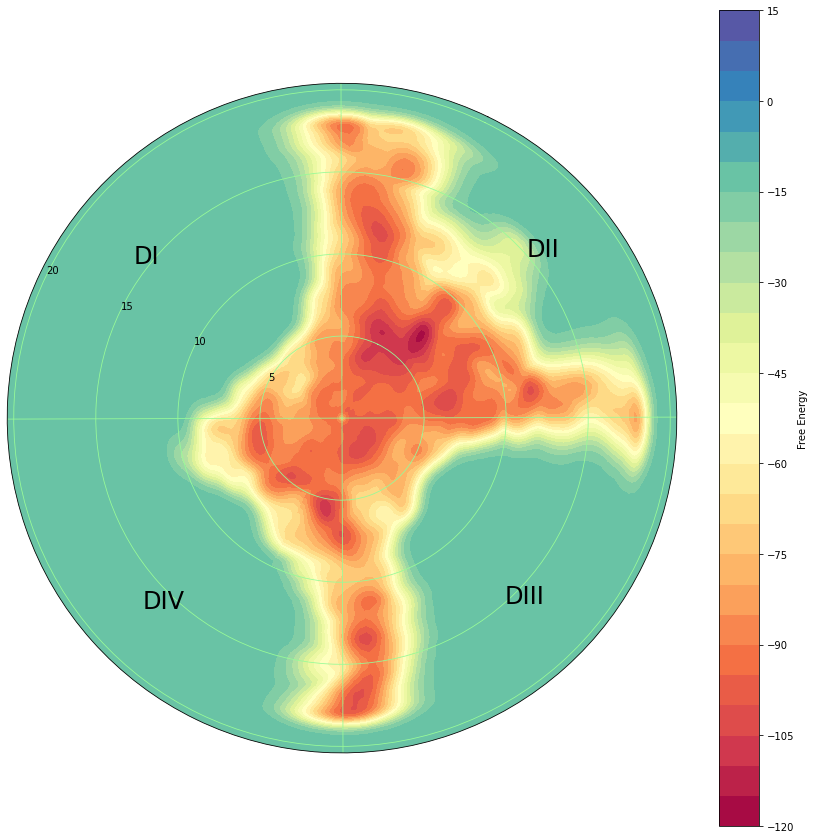

In [407]:
plot_polar_fes(fes_polar90)

(<Figure size 1080x1080 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7f4338fd3250>)

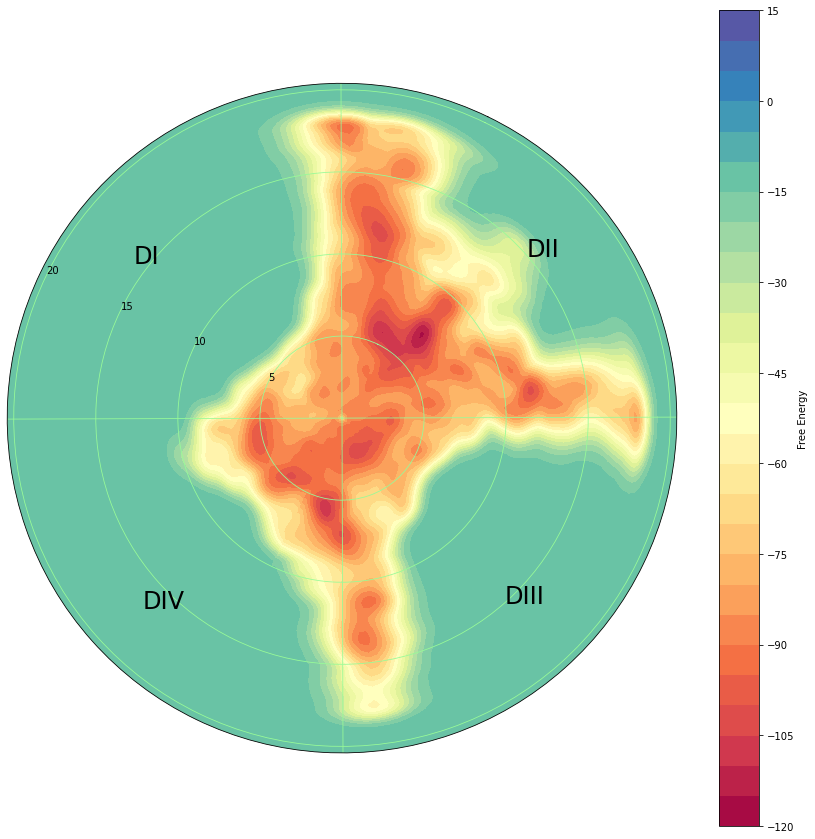

In [391]:
plot_polar_fes(fes_polar80)

(<Figure size 1080x1080 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7f43390a4070>)

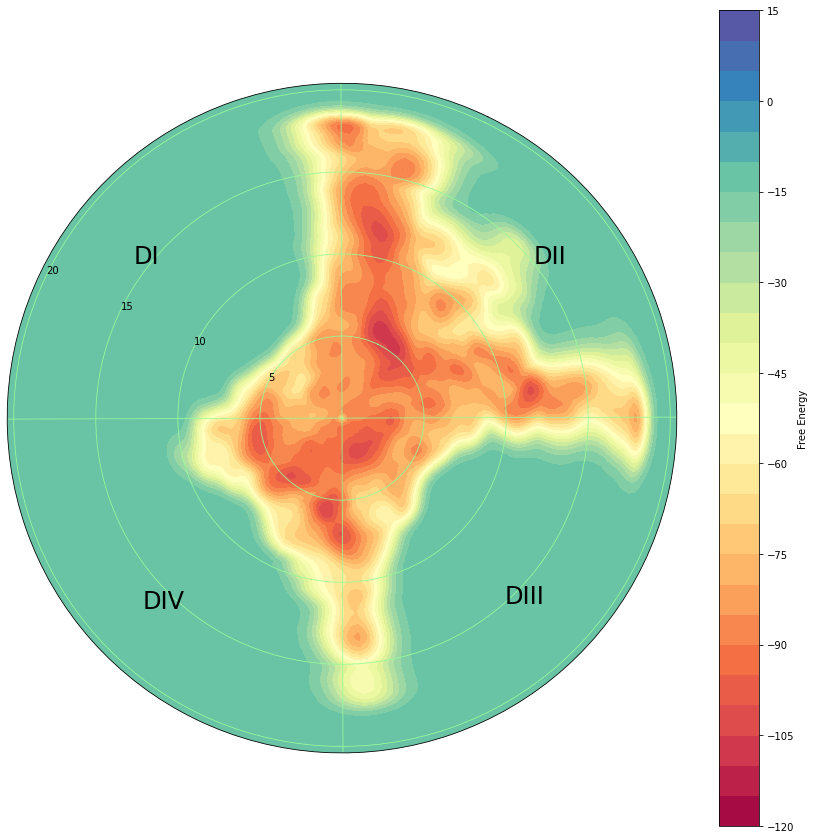

In [389]:
plot_polar_fes(fes_polar70)

(<Figure size 1080x1080 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7f433a2cde80>)

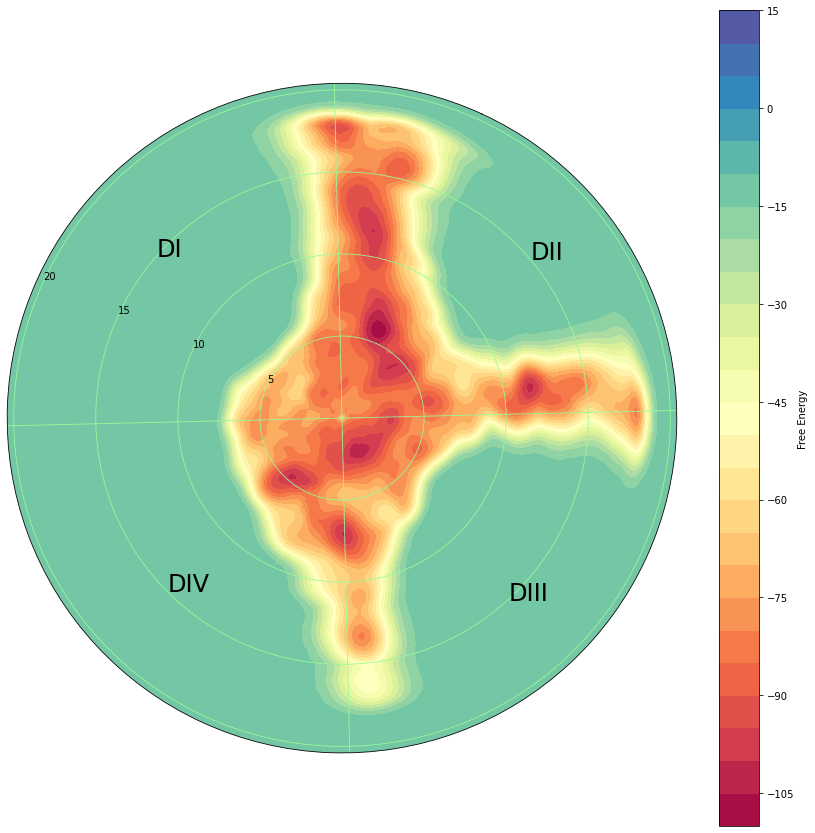

In [355]:
plot_polar_fes(fes_polar55)

(<Figure size 1080x1080 with 2 Axes>,
 <PolarAxesSubplot:>,
 <matplotlib.contour.QuadContourSet at 0x7f433ba14100>)

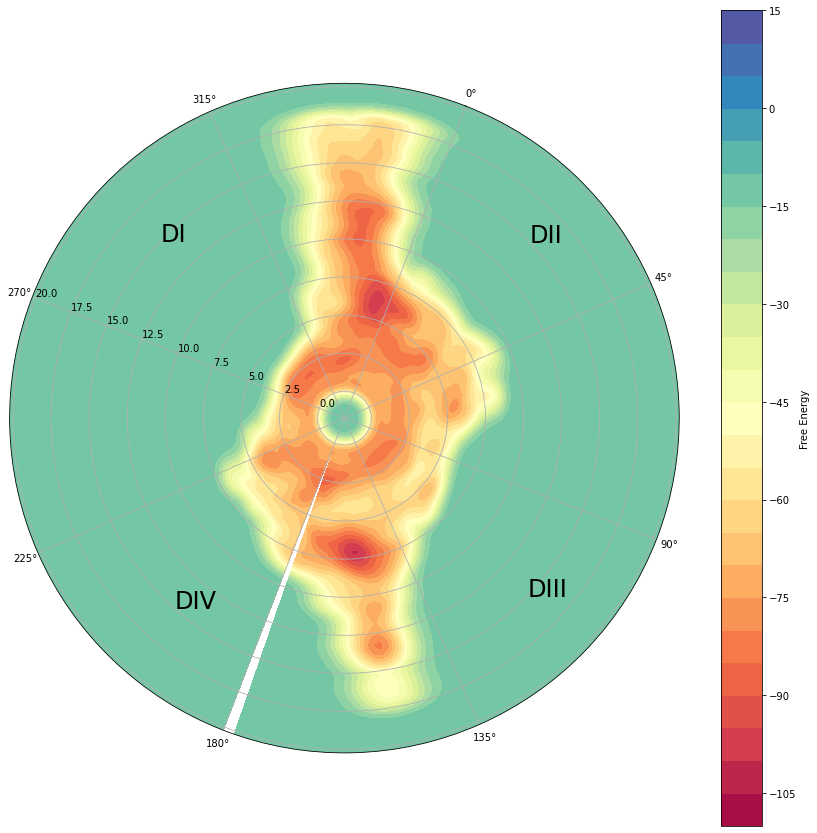

In [267]:
plot_polar_fes(fes_polar30)

In [26]:
import numpy as np
from matplotlib.pyplot import *
 
def plot_polar_contour(values, azimuths, zeniths):
    """Plot a polar contour plot, with 0 degrees at the North.
 
    Arguments:
 
     * `values` -- A list (or other iterable - eg. a NumPy array) of the values to plot on the
     contour plot (the `z` values)
     * `azimuths` -- A list of azimuths (in degrees)
     * `zeniths` -- A list of zeniths (that is, radii)
 
    The shapes of these lists are important, and are designed for a particular
    use case (but should be more generally useful). The values list should be `len(azimuths) * len(zeniths)`
    long with data for the first azimuth for all the zeniths, then the second azimuth for all the zeniths etc.
 
    This is designed to work nicely with data that is produced using a loop as follows:
 
    values = []
    for azimuth in azimuths:
      for zenith in zeniths:
        # Do something and get a result
        values.append(result)
 
    After that code the azimuths, zeniths and values lists will be ready to be passed into this function.
 
    """
    theta = np.radians(azimuths)
    zeniths = np.array(zeniths)
 
    values = np.array(values)
    values = values.reshape(len(azimuths), len(zeniths))
 
    r, theta = np.meshgrid(zeniths, np.radians(azimuths))
    fig, ax = subplots(subplot_kw=dict(projection='polar'))
    ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    autumn()
    cax = ax.contourf(theta, r, values, 30)
    autumn()
    cb = fig.colorbar(cax)
    cb.set_label("Pixel reflectance")
 
    return fig, ax, cax

In [494]:
dfhills = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD-DONOT_RSYNC/HILLS.ALL100', header=None, 
                            names=["time", "s", "z", "theta", "sigma_s", "sigma_z", "sigma_theta", "heights", "biasfactor", "clock"],
                            comment='#', widths=[23,23,23,23,23,23,23,23,23,11])

dfcolvar = pd.read_csv('/mnt/sda1/elainetao/METAD_LQZ/UZH_colvars/COLVARS', header=None, delimiter=' ', 
                            names=["time", "s", "z", "theta", "zwall.bias", "slwall.bias", "suwall.bias", "metad.bias"],
                            comment='#')

In [488]:
def sort_by_clock(df):
    df.sort_values("clock", inplace=True)
    df.reset_index(inplace=True)
    df.drop(columns='index', inplace=True)
    return df

         time         s          z     theta  sigma_s  sigma_z  sigma_theta  \
309116   8222 -3.633206   1.055232 -1.004137      0.5      0.5          0.1   
309117  91746  1.325523  10.117849  2.511557      0.5      0.5          0.1   
309118   7996 -4.137874   0.523488  1.658882      0.5      0.5          0.1   
309119  93404 -3.589001   3.281027 -0.380316      0.5      0.5          0.1   
309120   8058 -5.216002   0.084879  0.488225      0.5      0.5          0.1   

         heights  biasfactor       clock  
309116  0.107931          15  1616708093  
309117  0.647605          15  1616708095  
309118  0.093482          15  1616708100  
309119  0.098315          15  1616708100  
309120  0.129481          15  1616708100  


<AxesSubplot:xlabel='clock', ylabel='heights'>

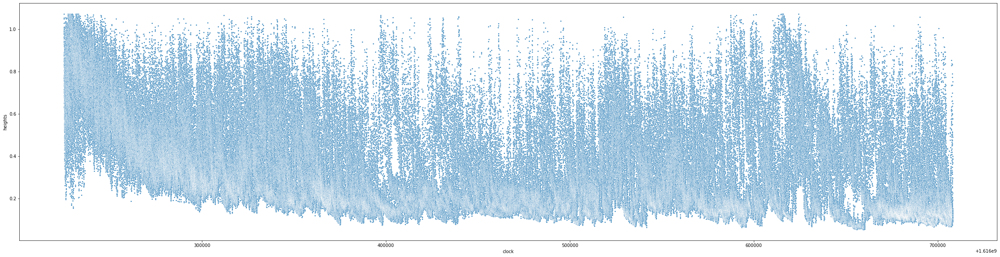

In [489]:
dfhills.sort_values("clock", inplace=True)
dfhills.reset_index(inplace=True)
dfhills.drop(columns='index', inplace=True)

print(dfhills.tail())
fig, ax = plt.subplots(figsize=(40, 10))
sns.scatterplot(data=dfhills, x='clock', y='heights', marker='.')

<AxesSubplot:xlabel='clock', ylabel='s'>

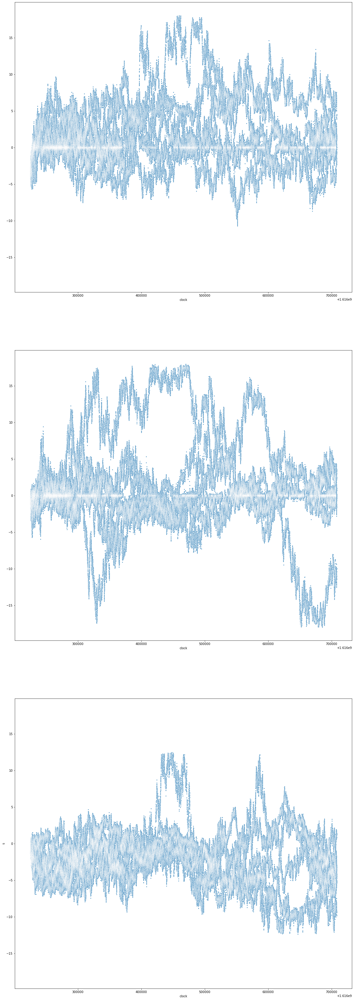

In [490]:
x = dfhills['z'] * np.sin(dfhills['theta'] + (np.pi/4))
y = dfhills['z'] * np.cos(dfhills['theta'] + (np.pi/4))
i = np.arange(0, 309121)

fig, axes = plt.subplots(3, 1, figsize=(20,60), sharey=True)
sns.scatterplot(x=dfhills['clock'], y=x, marker='.', ax=axes[0])
sns.scatterplot(x=dfhills['clock'], y=y, marker='.', ax=axes[1])
sns.scatterplot(x=dfhills['clock'], y=dfhills['s'], marker='.', ax=axes[2])

# OLD FES: hNav1.5 Free Energy @500ns (xy, yz)

In [204]:
fes500xydf = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fes500xy.grid', skiprows=9, header=None, names=['x','y','fes'])
fes500yzdf = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fes500yz.grid', skiprows=9, header=None, names=['y','z','fes'])

In [275]:
fesagf240xydf = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/AGF_WTMETAD/fes240xy.grid', skiprows=9, header=None, names=['x','y','fes'])
fesagf240yzdf = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/AGF_WTMETAD/fes240yz.grid', skiprows=9, header=None, names=['y','z','fes'])

In [86]:
#sns.choose_colorbrewer_palette('diverging')

## Checking convergence ~300ns

Text(-11, -16.8, 'DIII-IV')

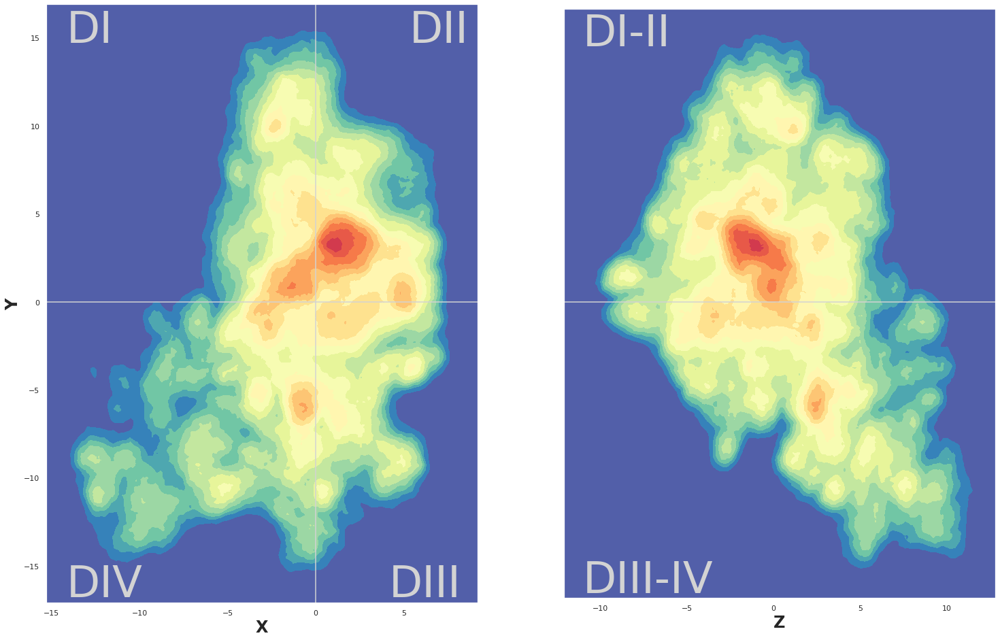

In [287]:
fig, axes = plt.subplots(1, 2, figsize=(25,25), sharey=True)

Z500xy = fes500xydf.pivot_table(index='x', columns='y', values='fes').T.values

X500xy_unique = np.sort(fes500xydf.x.unique())
Y500xy_unique = np.sort(fes500xydf.y.unique())
X500xy, Y500xy = np.meshgrid(X500xy_unique, Y500xy_unique)

axes[0].contourf(X500xy[:-1,:-1], Y500xy[:-1,:-1], Z500xy, levels=np.arange(-75, -10, 4), cmap='Spectral')
axes[0].axis('scaled')

Z500yz = fes500yzdf.pivot_table(index='y', columns='z', values='fes').T.values

X500yz_unique = np.sort(fes500yzdf.y.unique())
Y500yz_unique = np.sort(fes500yzdf.z.unique())
X500yz, Y500yz = np.meshgrid(X500yz_unique, Y500yz_unique)

axes[1].contourf(Y500yz[:-1,:-1], X500yz[:-1,:-1], Z500yz, levels=np.arange(-75, -10, 4), cmap='Spectral')
axes[1].axis('scaled')

axes[0].set_xlabel('X', fontweight='bold', fontsize=24)
axes[0].set_ylabel('Y', fontweight='bold', fontsize=24)
axes[1].set_xlabel('Z', fontweight='bold', fontsize=24)

axes[0].axvline(x=0, color='lightgrey')
axes[0].axhline(y=0, color='lightgrey')
axes[1].axhline(y=0, color='lightgrey')

plt.text(-40.8, 15, "DI", color='lightgrey')
plt.text(-21, 15, "DII", color='lightgrey')
plt.text(-40.8, -17, "DIV", color='lightgrey')
plt.text(-22.2, -17, "DIII", color='lightgrey')
plt.text(-11, 14.8, "DI-II", color='lightgrey')
plt.text(-11, -16.8, "DIII-IV", color='lightgrey')

Text(-9, -16.8, 'DIII-IV')

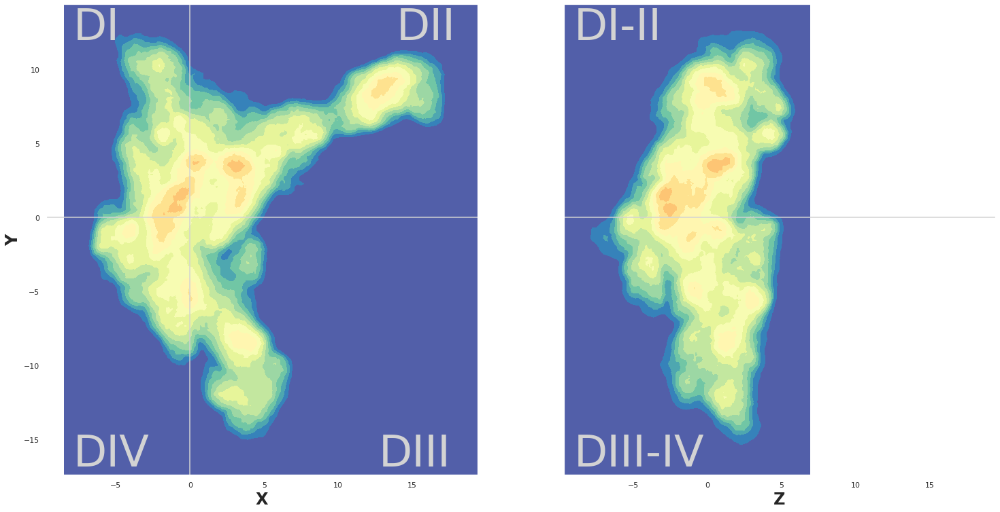

In [294]:
fig, axes = plt.subplots(1, 2, figsize=(25,25), sharey=True, sharex=True)

Z500xy = fesagf240xydf.pivot_table(index='x', columns='y', values='fes').T.values

X500xy_unique = np.sort(fesagf240xydf.x.unique())
Y500xy_unique = np.sort(fesagf240xydf.y.unique())
X500xy, Y500xy = np.meshgrid(X500xy_unique, Y500xy_unique)

axes[0].contourf(X500xy[:-1,:-1], Y500xy[:-1,:-1], Z500xy, levels=np.arange(-75, -10, 4), cmap='Spectral')
axes[0].axis('scaled')

Z500yz = fesagf240yzdf.pivot_table(index='y', columns='z', values='fes').T.values

X500yz_unique = np.sort(fesagf240yzdf.y.unique())
Y500yz_unique = np.sort(fesagf240yzdf.z.unique())
X500yz, Y500yz = np.meshgrid(X500yz_unique, Y500yz_unique)

axes[1].contourf(Y500yz[:-1,:-1], X500yz[:-1,:-1], Z500yz, levels=np.arange(-75, -10, 4), cmap='Spectral')
axes[1].axis('scaled')

axes[0].set_xlabel('X', fontweight='bold', fontsize=24)
axes[0].set_ylabel('Y', fontweight='bold', fontsize=24)
axes[1].set_xlabel('Z', fontweight='bold', fontsize=24)

axes[0].axvline(x=0, color='lightgrey')
axes[0].axhline(y=0, color='lightgrey')
axes[1].axhline(y=0, color='lightgrey')

plt.text(-42.8, 12, "DI", color='lightgrey')
plt.text(-21, 12, "DII", color='lightgrey')
plt.text(-42.8, -16.8, "DIV", color='lightgrey')
plt.text(-22.2, -16.8, "DIII", color='lightgrey')
plt.text(-9, 12, "DI-II", color='lightgrey')
plt.text(-9, -16.8, "DIII-IV", color='lightgrey')

^ AGF not centered - consider applying rotational matrix to grid data ??

### XY

In [104]:
fesdf = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesxy.grid', skiprows=9, header=None, names=['x','y','fes'])
fes360df = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fes360xy.grid', skiprows=9, header=None, names=['x','y','fes'])
fes300df = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fes300xy.grid', skiprows=9, header=None, names=['x','y','fes'])



In [71]:
# sns.kdeplot(
#     data=fesdf, x='x', y='y', fill=True, levels=100, thresh=-67, cmap="mako"
# )

In [72]:
# sns.kdeplot(
#     data=fes360df, x='x', y='y', fill=True, levels=100, thresh=-67
# )

(-11.6, 9.0, -17.1, 16.9)

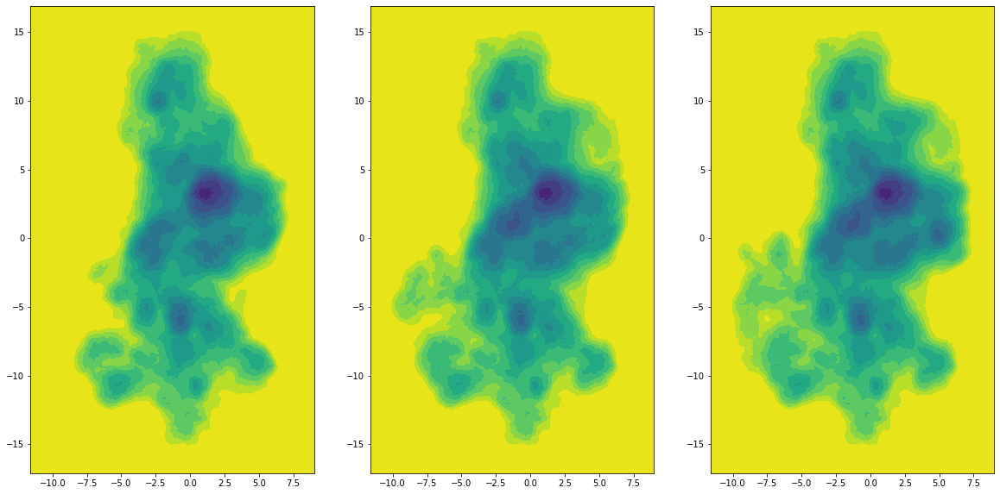

In [105]:
fig, axes = plt.subplots(1, 3, figsize=(20, 50))

Z = fesdf.pivot_table(index='x', columns='y', values='fes').T.values

X_unique = np.sort(fesdf.x.unique())
Y_unique = np.sort(fesdf.y.unique())
X, Y = np.meshgrid(X_unique, Y_unique)

axes[2].contourf(X[:-1,:-1], Y[:-1,:-1], Z, levels=np.arange(-70, -10, 4))
axes[2].axis('scaled')

# print(X[:,:-1])
# print(Y[:-1])
# print(Z)

Z360 = fes360df.pivot_table(index='x', columns='y', values='fes').T.values

X360_unique = np.sort(fes360df.x.unique())
Y360_unique = np.sort(fes360df.y.unique())
X360, Y360 = np.meshgrid(X360_unique, Y360_unique)

axes[1].contourf(X360[:-1,:-1], Y360[:-1,:-1], Z360, levels=np.arange(-70, -10, 4))
axes[1].axis('scaled')


Z300 = fes300df.pivot_table(index='x', columns='y', values='fes').T.values

X300_unique = np.sort(fes300df.x.unique())
Y300_unique = np.sort(fes300df.y.unique())
X300, Y300 = np.meshgrid(X300_unique, Y300_unique)

axes[0].contourf(X300[:-1,:-1], Y300[:-1,:-1], Z300, levels=np.arange(-70, -10, 4))
axes[0].axis('scaled')

### YZ

In [107]:
fesdfyz = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fesyz.grid', skiprows=9, header=None, names=['y','z','fes'])
fes360dfyz = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fes360yz.grid', skiprows=9, header=None, names=['y','z','fes'])
fes300dfyz = pd.read_fwf('/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/fes300yz.grid', skiprows=9, header=None, names=['y','z','fes'])



(-17.1, 16.9, -10.8, 12.0)

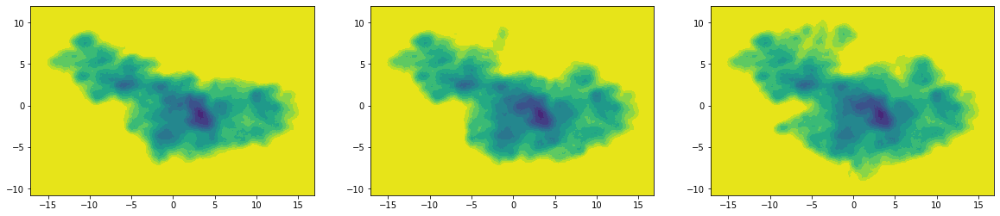

In [111]:
fig, axes = plt.subplots(1, 3, figsize=(20, 100))

Z = fesdfyz.pivot_table(index='y', columns='z', values='fes').T.values

X_unique = np.sort(fesdfyz.y.unique())
Y_unique = np.sort(fesdfyz.z.unique())
X, Y = np.meshgrid(X_unique, Y_unique)

axes[2].contourf(X[:-1,:-1], Y[:-1,:-1], Z, levels=np.arange(-70, -10, 4))
axes[2].axis('scaled')


Z360 = fes360dfyz.pivot_table(index='y', columns='z', values='fes').T.values

X360_unique = np.sort(fes360dfyz.y.unique())
Y360_unique = np.sort(fes360dfyz.z.unique())
X360, Y360 = np.meshgrid(X360_unique, Y360_unique)

axes[1].contourf(X360[:-1,:-1], Y360[:-1,:-1], Z360, levels=np.arange(-70, -10, 4))
axes[1].axis('scaled')


Z300 = fes300dfyz.pivot_table(index='y', columns='z', values='fes').T.values

X300_unique = np.sort(fes300dfyz.y.unique())
Y300_unique = np.sort(fes300dfyz.z.unique())
X300, Y300 = np.meshgrid(X300_unique, Y300_unique)

axes[0].contourf(X300[:-1,:-1], Y300[:-1,:-1], Z300, levels=np.arange(-70, -10, 4))
axes[0].axis('scaled')

### Hills Plot

In [136]:
# df_uzh_hills = dd.read_fwf("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.*", header=None, names=["time", "x", "y", "z", "sigmaxx", "sigmayy", 
#                                                             "sigmazz", "sigmayx", "sigmazy", "sigmazx", 
#                                                             "heights", "biasfactor", "clock"], comment='#')
# sns.scatterplot(df_uzh_hills['heights'])

In [146]:
# read HILLS in separate pandas dfs
# for name in glob.glob("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.*"): 
#     df_uzh_metad = dict()
#     i = 0 
#     df_uzh_metad[i] = pd.read_fwf(name, header=None, names=["time", "x", "y", "z", "sigmaxx", "sigmayy", 
#                                                             "sigmazz", "sigmayx", "sigmazy", "sigmazx", 
#                                                             "heights", "biasfactor", "clock"], comment='#')
#     i += 1

# df_uzh_metad = pd.concat([pd.read_fwf(f, header=None, names=["time", "x", "y", "z", "sigmaxx", "sigmayy", 
#                                                             "sigmazz", "sigmayx", "sigmazy", "sigmazx", 
#                                                             "heights", "biasfactor", "clock"], comment='#') 
#                           for f in glob.glob("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.*")], 
#                          ignore_index = True)
    
df_uzh_hills0 = pd.read_fwf("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.0", header=None, 
                            names=["time", "x", "y", "z", "sigmaxx", "sigmayy", "sigmazz", "sigmayx", "sigmazy", 
                                   "sigmazx", "heights", "biasfactor", "clock"], comment='#')
df_uzh_hills1 = pd.read_fwf("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.1", header=None, 
                            names=["time", "x", "y", "z", "sigmaxx", "sigmayy", "sigmazz", "sigmayx", "sigmazy", 
                                   "sigmazx", "heights", "biasfactor", "clock"], comment='#')
df_uzh_hills2 = pd.read_fwf("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.2", header=None, 
                            names=["time", "x", "y", "z", "sigmaxx", "sigmayy", "sigmazz", "sigmayx", "sigmazy", 
                                   "sigmazx", "heights", "biasfactor", "clock"], comment='#')
df_uzh_hills3 = pd.read_fwf("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.3", header=None, 
                            names=["time", "x", "y", "z", "sigmaxx", "sigmayy", "sigmazz", "sigmayx", "sigmazy", 
                                   "sigmazx", "heights", "biasfactor", "clock"], comment='#')
df_uzh_hills4 = pd.read_fwf("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.4", header=None, 
                            names=["time", "x", "y", "z", "sigmaxx", "sigmayy", "sigmazz", "sigmayx", "sigmazy", 
                                   "sigmazx", "heights", "biasfactor", "clock"], comment='#')
df_uzh_hills5 = pd.read_fwf("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/HILLS.5", header=None, 
                            names=["time", "x", "y", "z", "sigmaxx", "sigmayy", "sigmazz", "sigmayx", "sigmazy", 
                                   "sigmazx", "heights", "biasfactor", "clock"], comment='#')


<AxesSubplot:ylabel='heights'>

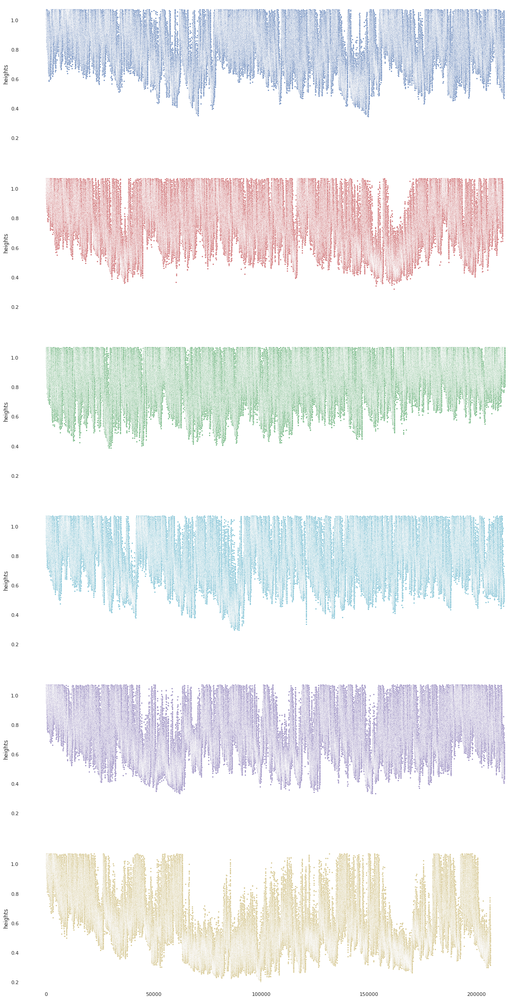

In [201]:
fig, axes = plt.subplots(6, 1, figsize=(20, 40), sharey='all', sharex='all')

plt.subplots_adjust(wspace=0)
sns.despine()
sns.set(rc={'axes.facecolor':'white'})

sns.scatterplot(data=df_uzh_hills0['heights'], ax=axes[0], marker='.', color='b')
sns.scatterplot(data=df_uzh_hills1['heights'], ax=axes[1], marker='.', color='r')
sns.scatterplot(data=df_uzh_hills2['heights'], ax=axes[2], marker='.', color='g')
sns.scatterplot(data=df_uzh_hills3['heights'], ax=axes[3], marker='.', color='c')
sns.scatterplot(data=df_uzh_hills4['heights'], ax=axes[4], marker='.', color='m')
sns.scatterplot(data=df_uzh_hills5['heights'], ax=axes[5], marker='.', color='y')

### Plotting each COLVAR against time to check sampling

In [185]:
# read COLVAR files in separate pandas dfs

df_uzh_colvar0 = pd.read_csv("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/COLVAR.0", header=None, 
                            names=["time", "x", "y", "z", "uwallx.bias", "lwallx.bias", "uwally.bias", 
                                   "lwally.bias", "uwallz.bias", "lwallz.bias", "metad.bias", "metad.rbias"], 
                            delimiter=' ', comment='#').reset_index(drop=True)
df_uzh_colvar1 = pd.read_csv("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/COLVAR.1", header=None, 
                            names=["time", "x", "y", "z", "uwallx.bias", "lwallx.bias", "uwally.bias", 
                                   "lwally.bias", "uwallz.bias", "lwallz.bias", "metad.bias", "metad.rbias"], 
                            delimiter=' ', comment='#').reset_index(drop=True)
df_uzh_colvar2 = pd.read_csv("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/COLVAR.2", header=None, 
                            names=["time", "x", "y", "z", "uwallx.bias", "lwallx.bias", "uwally.bias", 
                                   "lwally.bias", "uwallz.bias", "lwallz.bias", "metad.bias", "metad.rbias"], 
                            delimiter=' ', comment='#').reset_index(drop=True)
df_uzh_colvar3 = pd.read_csv("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/COLVAR.3", header=None, 
                            names=["time", "x", "y", "z", "uwallx.bias", "lwallx.bias", "uwally.bias", 
                                   "lwally.bias", "uwallz.bias", "lwallz.bias", "metad.bias", "metad.rbias"], 
                            delimiter=' ', comment='#').reset_index(drop=True)
df_uzh_colvar4 = pd.read_csv("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/COLVAR.4", header=None, 
                            names=["time", "x", "y", "z", "uwallx.bias", "lwallx.bias", "uwally.bias", 
                                   "lwally.bias", "uwallz.bias", "lwallz.bias", "metad.bias", "metad.rbias"], 
                            delimiter=' ', comment='#').reset_index(drop=True)
df_uzh_colvar5 = pd.read_csv("/mnt/sda1/elainetao/METAD_LQZ/UZH_WTMETAD/COLVAR.5", header=None, 
                            names=["time", "x", "y", "z", "uwallx.bias", "lwallx.bias", "uwally.bias", 
                                   "lwally.bias", "uwallz.bias", "lwallz.bias", "metad.bias", "metad.rbias"], 
                            delimiter=' ', comment='#').reset_index(drop=True)

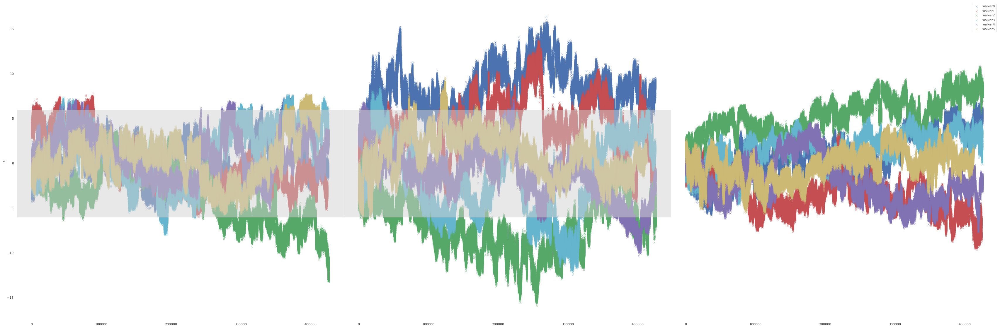

In [295]:
fig, axes = plt.subplots(1, 3, figsize=(60, 20), sharex=True, sharey=True)

plt.subplots_adjust(wspace=0)
sns.despine()
sns.set(rc={'axes.facecolor':'white'})
plt.rcParams.update({'font.size': 64})

axes[0].axhspan(-6, 6, alpha=0.5, color='lightgrey')
axes[1].axhspan(-6, 6, alpha=0.5, color='lightgrey')

sns.scatterplot(data=df_uzh_colvar0['x'], ax=axes[0], marker='x', color='b')
sns.scatterplot(data=df_uzh_colvar1['x'], ax=axes[0], marker='x', color='r')
sns.scatterplot(data=df_uzh_colvar2['x'], ax=axes[0], marker='x', color='g')
sns.scatterplot(data=df_uzh_colvar3['x'], ax=axes[0], marker='x', color='c')
sns.scatterplot(data=df_uzh_colvar4['x'], ax=axes[0], marker='x', color='m')
sns.scatterplot(data=df_uzh_colvar5['x'], ax=axes[0], marker='x', color='y')

sns.scatterplot(data=df_uzh_colvar0['y'], ax=axes[1], marker='x', color='b')
sns.scatterplot(data=df_uzh_colvar1['y'], ax=axes[1], marker='x', color='r')
sns.scatterplot(data=df_uzh_colvar2['y'], ax=axes[1], marker='x', color='g')
sns.scatterplot(data=df_uzh_colvar3['y'], ax=axes[1], marker='x', color='c')
sns.scatterplot(data=df_uzh_colvar4['y'], ax=axes[1], marker='x', color='m')
sns.scatterplot(data=df_uzh_colvar5['y'], ax=axes[1], marker='x', color='y')

sns.scatterplot(data=df_uzh_colvar0['z'], ax=axes[2], marker='x', color='b', label='walker0')
sns.scatterplot(data=df_uzh_colvar1['z'], ax=axes[2], marker='x', color='r', label='walker1')
sns.scatterplot(data=df_uzh_colvar2['z'], ax=axes[2], marker='x', color='g', label='walker2')
sns.scatterplot(data=df_uzh_colvar3['z'], ax=axes[2], marker='x', color='c', label='walker3')
sns.scatterplot(data=df_uzh_colvar4['z'], ax=axes[2], marker='x', color='m', label='walker4')
sns.scatterplot(data=df_uzh_colvar5['z'], ax=axes[2], marker='x', color='y', label='walker5')

plt.legend()

# LQZ Cluster Analysis 
***
to identify top 5 clusters of lidocaine position (top cluster represents lidocaine binding ?)
***

* using VMD command : measure cluster
* combine all 6 walkers into one long traj ?
* may need to do reweighting first to account for metad biases ?

# Fenestration Analysis of Metadynamics Runs
***
to determine how lidocaine influences the radius of the fenestrations (specifically if a planar molecule does affect the absolute radius width measured by caver ?)
***

* output strided pdbs of pore module (1000 frames each walker / 0.5ns stride)
* optimise caver using approximate clustering


# Identifying LQZ path within the pore/fenestrations

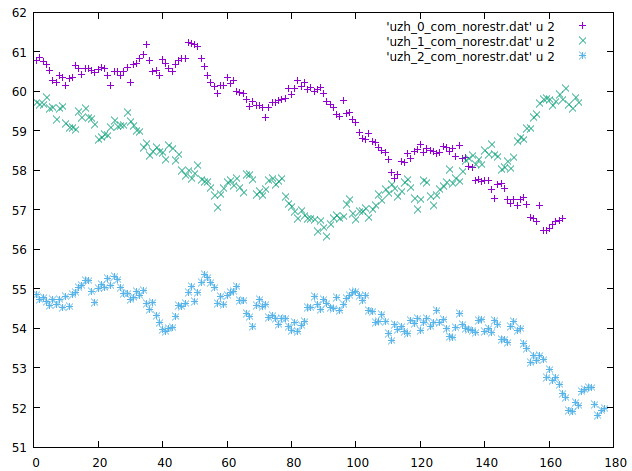
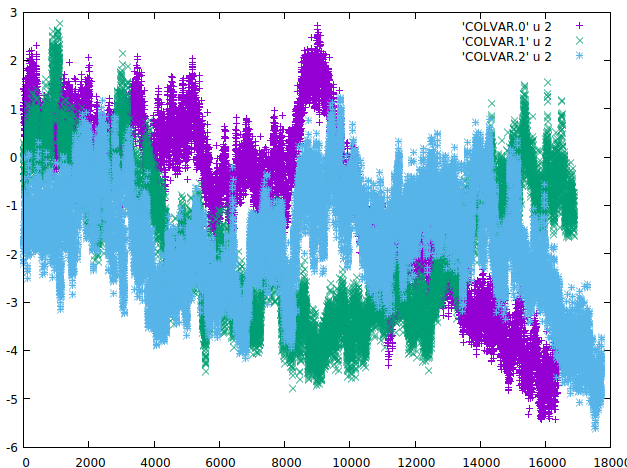

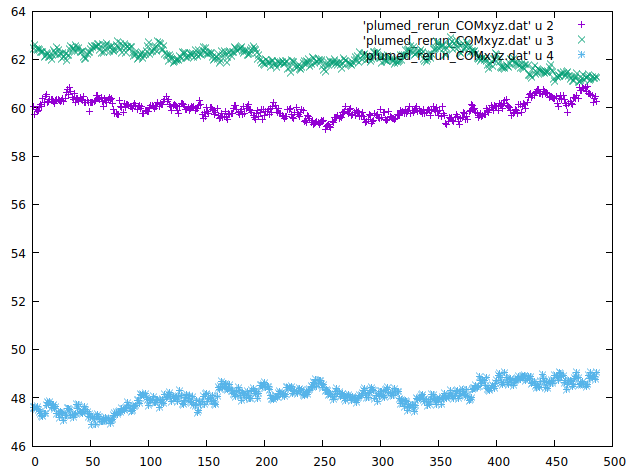
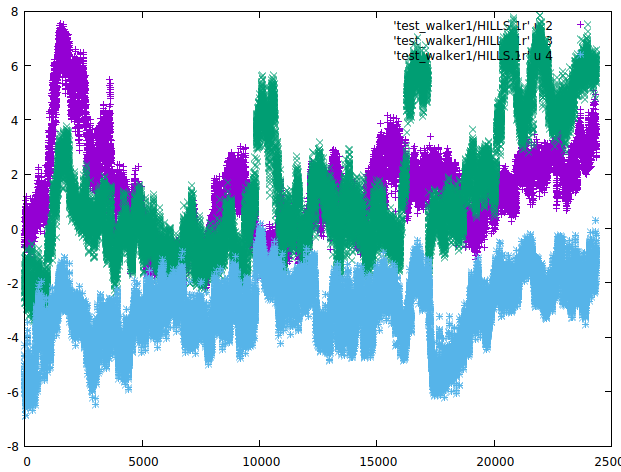